In [1]:
# set wd so we can load the settings.yaml file.
import os
os.chdir("/data/sonakshi/PromptDataExtraction")

In [12]:
import matplotlib.pyplot as plt
plt.style.use("/data/sonakshi/PromptDataExtraction/scripts/matplotlib.mplstyle")

In [3]:
import sett
from backend.utils.frame import Frame
from backend.data import mongodb
from backend import postgres
from backend.postgres.orm import PaperTexts

In [4]:
sett.load_settings()
postgres.load_settings()
db = postgres.connect()

mongo = mongodb.connect()
collection = mongo["polymer_DOI_records_prod"]

2023-09-10 18:03:20,258| ERROR   | Password is required for key /home/sonakshi/.ssh/id_rsa


Load OK: settings.yaml
NOTE  -- postgres_ SSH tunnel established.


In [25]:
df = Frame()

# get the dois from postgres
dois = db.query(PaperTexts.doi.distinct()).all(); #SELECT DISTINCT(column1) FROM your_table

# for each doi, select the document from mongodb
for doi, in dois:
    print(doi)
    pgcount = 0
    mgcount = 0

    # count the number of documents in postgres
    paras = PaperTexts().get_all(db, {'doi': doi})
    if paras:
        pgcount = len(paras)

    print("PG count =", pgcount)

    # count the number of documents in mongodb
    document = collection.find_one({'DOI': doi})
    if document:
        fulltext = document.get('full_text')
        for section in fulltext:

            if type(section) is str:
                if len(section) !=0:
                    mgcount += 1

            #if section is dictionary
            elif type(section) is dict:
                contents = section['content']
                if type(contents) is str and len(contents)>0:
                     mgcount += 1
                else:
                    mgcount += len(contents)

    print("MG count =", mgcount)

    # create a df as doi, pgcount, mgcount
    df.add(doi=doi, pgcount=pgcount, mgcount=mgcount)

df.save("parse_papers/full_text_parse/CompareMongo.csv")

10.1002/1521-3900(200103)167:1<243::aid-masy243>3.0.co;2-1
PG count = 4
MG count = 0
10.1002/fuce.201200040
PG count = 4
MG count = 0
10.1002/(sici)1097-0010(19990301)79:3<481::aid-jsfa267>3.0.co;2-3
PG count = 5
MG count = 0
10.1002/(sici)1098-1071(1998)9:2<151::aid-hc9>3.0.co;2-f
PG count = 7
MG count = 0
10.1002/(sici)1521-396x(199808)168:2<441::aid-pssa441>3.0.co;2-v
PG count = 4
MG count = 0
10.1002/(sici)1521-4044(199809)49:9<482::aid-apol482>3.0.co;2-e
PG count = 4
MG count = 0
10.1002/(sici)1522-9505(19980401)256:1<9::aid-apmc9>3.0.co;2-d
PG count = 7
MG count = 1
10.1002/(sici)1522-9505(19981101)260:1<65::aid-apmc65>3.0.co;2-c
PG count = 5
MG count = 1
10.1002/(sici)1522-9505(19990301)265:1<5::aid-apmc5>3.0.co;2-r
PG count = 5
MG count = 1
10.1016/b978-0-444-53349-4.00097-2
PG count = 49
MG count = 5
10.1016/b978-0-444-53349-4.00271-5
PG count = 87
MG count = 16
10.1016/b978-0-444-53711-9.50145-0
PG count = 13
MG count = 4
10.1016/j.aiepr.2020.10.002
PG count = 25
MG count = 7

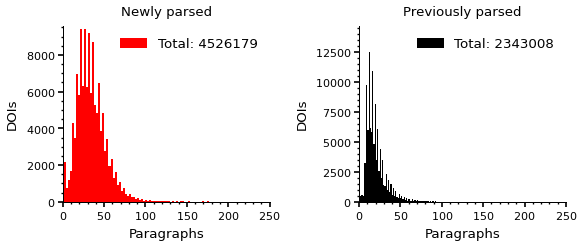

In [26]:
# plot a histogram for pgcount vs mgcount
stats = df.df

fig, ax = plt.subplots(1, 2, figsize=(5, 2.2))
total = stats.pgcount.sum()
ax[0].hist(stats.pgcount, bins=500, color='r', label="Total: %d" %total)

ax[0].legend()
ax[0].set(title="Newly parsed", ylabel="DOIs",
          xlabel="Paragraphs", xlim = (0,250))

total = stats.mgcount.sum()
ax[1].hist(stats.mgcount, bins=500, color='k', label="Total: %d" %total)
ax[1].legend()
ax[1].set(title="Previously parsed", ylabel="DOIs",
          xlabel="Paragraphs", xlim = (0,250))

plt.tight_layout()
plt.savefig("parse_papers/full_text_parse/CompareMongo.png", dpi=600)
plt.show()

<Axes: >

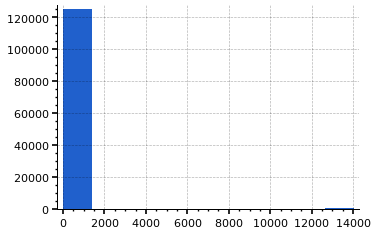

In [23]:
stats.mgcount.hist()

In [24]:
mask = stats.mgcount > 1000
stats[mask]

,doi,pgcount,mgcount
2485,10.1021/acsami.5b05087,18,14023


In [19]:
stats.sum()

doi        10.1002/1521-3900(200103)167:1<243::aid-masy24...
pgcount                                              4419181
mgcount                                              2300268
dtype: object

In [6]:
df.save("parse_papers/CompareMongo.csv")

In [ ]:
import json 

with open("poly_error")